In [1]:
import cv2
import argparse
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import torchvision.utils as vutils
import math
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torchvision import datasets
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F
import torch

In [2]:
parser = argparse.ArgumentParser()
parser.add_argument("--n_epochs", type=int, default=20, help="number ofepochs of training")
parser.add_argument("--batch_size", type=int, default=128, help="size of thr batches")
parser.add_argument("--lr", type=float, default=0.0002, help="adam: learning rate")
parser.add_argument("--b1", type=float, default=0.5, help="adam: decay of first order momentum of gradient")
parser.add_argument("--b2", type=float, default=0.999, help="adam: decay of first order momentum of gradient")
parser.add_argument("--n_cpu", type=int, default=4, help="number of cpu threads to use during batch generation")
parser.add_argument("--latent_dim", type=int, default=50, help="dimensionality of the latent space")
parser.add_argument("--img_size", type=int, default=28, help="size of each image dimension")
parser.add_argument("--channels", type=int, default=1, help="number of image channels")
parser.add_argument("--sample_interval", type=int, default=400, help="interval between image samples")
opt = parser.parse_args(args=[])
print(opt)
img_shape = (opt.img_size, opt.img_size, opt.channels)
cuda = True if torch.cuda.is_available() else False
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

Namespace(n_epochs=20, batch_size=128, lr=0.0002, b1=0.5, b2=0.999, n_cpu=4, latent_dim=50, img_size=28, channels=1, sample_interval=400)


In [3]:
def to_img(x):
    out = 0.5*(x+1.0)
    out = out.clamp(0, 1)  # Clamp函数可以将随机变化的数值限制在一个给定的区间[min, max]内：
    out = out.view(28,28,1)  # view()函数作用是将一个多行的Tensor,拼接成一行
    return out

In [4]:
class Flatten(nn.Module):
    def __init__(self):
        super(Flatten, self).__init__()
    
    def forward(self, x):
        return x.view(x.size(0), -1)

In [6]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [5]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.ConvTranspose2d(50, 32*4, 4, 1, 0, bias=False),
            nn.BatchNorm2d(32*4),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(32*4, 32*2, 3, 2, 1, bias=False),
            nn.BatchNorm2d(32*2),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(32*2, 32, 4, 2, 1, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(32, 1, 4, 2, 1, bias=False),
            nn.Tanh()
        )
        
    def forward(self, x):
        return self.model(x)

In [7]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(1, 32, 4, 2, 1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(32, 32*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(32*2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(32*2, 32*4, 3, 2, 1, bias=False),
            nn.BatchNorm2d(32*4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(32*4, 1, 4, 1, 0, bias=False),
            Flatten(),
            nn.Sigmoid()
        )
        
    def forward(self, x):
        return self.model(x)

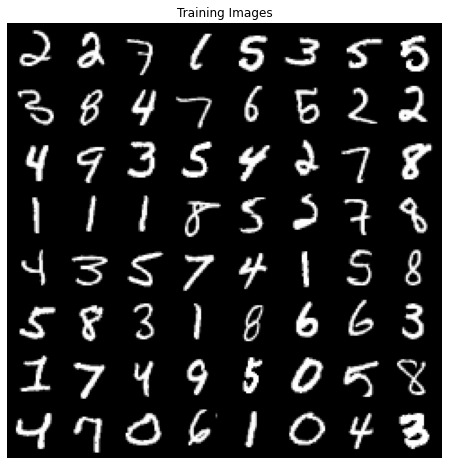

In [8]:
# Loading image data
Train_Data = pd.read_csv('./train.csv')
Train_Data = Train_Data.values
train_data = Train_Data[:,1:785]
train_data = train_data.reshape(42000,1,28,28)
train_data = torch.Tensor(train_data/255.0*2.0-1.0)
dataloader = torch.utils.data.DataLoader(
        dataset = train_data,
        batch_size=opt.batch_size,
        shuffle=True
)

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch.to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [9]:
# Loss function
criterion = nn.BCELoss()

# Initialize generator & discriminator
netG = Generator()
netG.apply(weights_init)
print(netG)

netD = Discriminator()
netD.apply(weights_init)
print(netD)

if cuda:
    netG.cuda()
    netD.cuda()
    criterion.cuda()

# Optimizers
optimizer_G = torch.optim.Adam(netG.parameters(), lr=opt.lr, betas=(opt.b1, opt.b2))
optimizer_D = torch.optim.Adam(netD.parameters(), lr=opt.lr, betas=(opt.b1, opt.b2))

Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor

Generator(
  (model): Sequential(
    (0): ConvTranspose2d(50, 128, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(128, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(64, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(32, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): Tanh()
  )
)
Discriminator(
  (model): Sequential(
    (0): Conv2d(1, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2)

[Epoch 0/20] [Batch 1/329] [D loss: 0.694140] [G loss: 1.385588]
[Epoch 0/20] [Batch 2/329] [D loss: 0.413291] [G loss: 1.768374]
[Epoch 0/20] [Batch 3/329] [D loss: 0.263413] [G loss: 2.131045]
[Epoch 0/20] [Batch 4/329] [D loss: 0.164385] [G loss: 2.544117]
[Epoch 0/20] [Batch 5/329] [D loss: 0.111644] [G loss: 2.882022]
[Epoch 0/20] [Batch 6/329] [D loss: 0.082920] [G loss: 3.114278]
[Epoch 0/20] [Batch 7/329] [D loss: 0.058091] [G loss: 3.371715]
[Epoch 0/20] [Batch 8/329] [D loss: 0.045895] [G loss: 3.612506]
[Epoch 0/20] [Batch 9/329] [D loss: 0.041994] [G loss: 3.720565]
[Epoch 0/20] [Batch 10/329] [D loss: 0.034289] [G loss: 3.864377]
[Epoch 0/20] [Batch 11/329] [D loss: 0.032288] [G loss: 3.957650]
[Epoch 0/20] [Batch 12/329] [D loss: 0.026981] [G loss: 4.055874]
[Epoch 0/20] [Batch 13/329] [D loss: 0.022490] [G loss: 4.197219]
[Epoch 0/20] [Batch 14/329] [D loss: 0.021540] [G loss: 4.305088]
[Epoch 0/20] [Batch 15/329] [D loss: 0.020651] [G loss: 4.371480]
[Epoch 0/20] [Batch

[Epoch 0/20] [Batch 125/329] [D loss: 0.025108] [G loss: 4.466829]
[Epoch 0/20] [Batch 126/329] [D loss: 0.026187] [G loss: 4.447804]
[Epoch 0/20] [Batch 127/329] [D loss: 0.028577] [G loss: 4.257139]
[Epoch 0/20] [Batch 128/329] [D loss: 0.030394] [G loss: 4.158597]
[Epoch 0/20] [Batch 129/329] [D loss: 0.031885] [G loss: 4.362881]
[Epoch 0/20] [Batch 130/329] [D loss: 0.034943] [G loss: 4.248808]
[Epoch 0/20] [Batch 131/329] [D loss: 0.036727] [G loss: 3.934225]
[Epoch 0/20] [Batch 132/329] [D loss: 0.033081] [G loss: 4.399520]
[Epoch 0/20] [Batch 133/329] [D loss: 0.036555] [G loss: 4.064178]
[Epoch 0/20] [Batch 134/329] [D loss: 0.037027] [G loss: 4.135398]
[Epoch 0/20] [Batch 135/329] [D loss: 0.034178] [G loss: 4.121080]
[Epoch 0/20] [Batch 136/329] [D loss: 0.040607] [G loss: 3.741647]
[Epoch 0/20] [Batch 137/329] [D loss: 0.035293] [G loss: 4.476490]
[Epoch 0/20] [Batch 138/329] [D loss: 0.028881] [G loss: 4.311876]
[Epoch 0/20] [Batch 139/329] [D loss: 0.032665] [G loss: 3.770

[Epoch 0/20] [Batch 248/329] [D loss: 0.093283] [G loss: 2.865462]
[Epoch 0/20] [Batch 249/329] [D loss: 0.083852] [G loss: 3.022670]
[Epoch 0/20] [Batch 250/329] [D loss: 0.092258] [G loss: 3.020617]
[Epoch 0/20] [Batch 251/329] [D loss: 0.079890] [G loss: 3.035854]
[Epoch 0/20] [Batch 252/329] [D loss: 0.080482] [G loss: 3.304940]
[Epoch 0/20] [Batch 253/329] [D loss: 0.083507] [G loss: 2.676347]
[Epoch 0/20] [Batch 254/329] [D loss: 0.089764] [G loss: 3.390418]
[Epoch 0/20] [Batch 255/329] [D loss: 0.090320] [G loss: 2.458083]
[Epoch 0/20] [Batch 256/329] [D loss: 0.104618] [G loss: 3.910244]
[Epoch 0/20] [Batch 257/329] [D loss: 0.123555] [G loss: 1.358374]
[Epoch 0/20] [Batch 258/329] [D loss: 0.233184] [G loss: 6.965099]
[Epoch 0/20] [Batch 259/329] [D loss: 1.057609] [G loss: 0.009945]
[Epoch 0/20] [Batch 260/329] [D loss: 2.423055] [G loss: 4.180435]
[Epoch 0/20] [Batch 261/329] [D loss: 0.125624] [G loss: 5.197516]
[Epoch 0/20] [Batch 262/329] [D loss: 0.343463] [G loss: 1.334

[Epoch 1/20] [Batch 43/329] [D loss: 0.170054] [G loss: 2.412039]
[Epoch 1/20] [Batch 44/329] [D loss: 0.151431] [G loss: 2.062152]
[Epoch 1/20] [Batch 45/329] [D loss: 0.144454] [G loss: 2.599595]
[Epoch 1/20] [Batch 46/329] [D loss: 0.151403] [G loss: 1.880110]
[Epoch 1/20] [Batch 47/329] [D loss: 0.169959] [G loss: 2.869714]
[Epoch 1/20] [Batch 48/329] [D loss: 0.180138] [G loss: 1.372356]
[Epoch 1/20] [Batch 49/329] [D loss: 0.188990] [G loss: 3.504131]
[Epoch 1/20] [Batch 50/329] [D loss: 0.222049] [G loss: 0.997216]
[Epoch 1/20] [Batch 51/329] [D loss: 0.281614] [G loss: 4.468953]
[Epoch 1/20] [Batch 52/329] [D loss: 0.505991] [G loss: 0.131875]
[Epoch 1/20] [Batch 53/329] [D loss: 1.058145] [G loss: 5.505661]
[Epoch 1/20] [Batch 54/329] [D loss: 0.906297] [G loss: 0.702260]
[Epoch 1/20] [Batch 55/329] [D loss: 0.437211] [G loss: 2.592593]
[Epoch 1/20] [Batch 56/329] [D loss: 0.177630] [G loss: 2.770405]
[Epoch 1/20] [Batch 57/329] [D loss: 0.198486] [G loss: 1.516514]
[Epoch 1/2

[Epoch 1/20] [Batch 167/329] [D loss: 0.394881] [G loss: 2.765031]
[Epoch 1/20] [Batch 168/329] [D loss: 0.368805] [G loss: 0.942334]
[Epoch 1/20] [Batch 169/329] [D loss: 0.385090] [G loss: 2.727101]
[Epoch 1/20] [Batch 170/329] [D loss: 0.374422] [G loss: 0.844665]
[Epoch 1/20] [Batch 171/329] [D loss: 0.344276] [G loss: 2.546052]
[Epoch 1/20] [Batch 172/329] [D loss: 0.327093] [G loss: 1.067825]
[Epoch 1/20] [Batch 173/329] [D loss: 0.286990] [G loss: 2.521385]
[Epoch 1/20] [Batch 174/329] [D loss: 0.304450] [G loss: 1.122321]
[Epoch 1/20] [Batch 175/329] [D loss: 0.265231] [G loss: 2.490459]
[Epoch 1/20] [Batch 176/329] [D loss: 0.271104] [G loss: 1.075961]
[Epoch 1/20] [Batch 177/329] [D loss: 0.302006] [G loss: 2.896399]
[Epoch 1/20] [Batch 178/329] [D loss: 0.340166] [G loss: 0.660147]
[Epoch 1/20] [Batch 179/329] [D loss: 0.477050] [G loss: 3.989115]
[Epoch 1/20] [Batch 180/329] [D loss: 0.711266] [G loss: 0.229971]
[Epoch 1/20] [Batch 181/329] [D loss: 0.885079] [G loss: 3.165

[Epoch 1/20] [Batch 290/329] [D loss: 0.368745] [G loss: 2.125055]
[Epoch 1/20] [Batch 291/329] [D loss: 0.397021] [G loss: 0.798557]
[Epoch 1/20] [Batch 292/329] [D loss: 0.401927] [G loss: 2.528607]
[Epoch 1/20] [Batch 293/329] [D loss: 0.478233] [G loss: 0.458174]
[Epoch 1/20] [Batch 294/329] [D loss: 0.557626] [G loss: 2.803975]
[Epoch 1/20] [Batch 295/329] [D loss: 0.506713] [G loss: 0.675433]
[Epoch 1/20] [Batch 296/329] [D loss: 0.458756] [G loss: 2.042299]
[Epoch 1/20] [Batch 297/329] [D loss: 0.366756] [G loss: 1.198052]
[Epoch 1/20] [Batch 298/329] [D loss: 0.344831] [G loss: 1.635900]
[Epoch 1/20] [Batch 299/329] [D loss: 0.347477] [G loss: 1.187496]
[Epoch 1/20] [Batch 300/329] [D loss: 0.375280] [G loss: 1.737553]
[Epoch 1/20] [Batch 301/329] [D loss: 0.354358] [G loss: 1.033163]
[Epoch 1/20] [Batch 302/329] [D loss: 0.345809] [G loss: 2.071122]
[Epoch 1/20] [Batch 303/329] [D loss: 0.364015] [G loss: 0.823415]
[Epoch 1/20] [Batch 304/329] [D loss: 0.400136] [G loss: 2.673

[Epoch 2/20] [Batch 85/329] [D loss: 0.446069] [G loss: 1.395748]
[Epoch 2/20] [Batch 86/329] [D loss: 0.414022] [G loss: 1.159937]
[Epoch 2/20] [Batch 87/329] [D loss: 0.403442] [G loss: 1.341385]
[Epoch 2/20] [Batch 88/329] [D loss: 0.400491] [G loss: 1.209578]
[Epoch 2/20] [Batch 89/329] [D loss: 0.408774] [G loss: 1.266281]
[Epoch 2/20] [Batch 90/329] [D loss: 0.430330] [G loss: 1.178146]
[Epoch 2/20] [Batch 91/329] [D loss: 0.410829] [G loss: 1.122746]
[Epoch 2/20] [Batch 92/329] [D loss: 0.444731] [G loss: 1.580387]
[Epoch 2/20] [Batch 93/329] [D loss: 0.439724] [G loss: 0.671514]
[Epoch 2/20] [Batch 94/329] [D loss: 0.522059] [G loss: 2.554993]
[Epoch 2/20] [Batch 95/329] [D loss: 0.618208] [G loss: 0.327742]
[Epoch 2/20] [Batch 96/329] [D loss: 0.721671] [G loss: 2.172478]
[Epoch 2/20] [Batch 97/329] [D loss: 0.509997] [G loss: 0.958101]
[Epoch 2/20] [Batch 98/329] [D loss: 0.422786] [G loss: 1.313165]
[Epoch 2/20] [Batch 99/329] [D loss: 0.462340] [G loss: 1.188229]
[Epoch 2/2

[Epoch 2/20] [Batch 208/329] [D loss: 0.462450] [G loss: 0.926023]
[Epoch 2/20] [Batch 209/329] [D loss: 0.440305] [G loss: 1.421290]
[Epoch 2/20] [Batch 210/329] [D loss: 0.421178] [G loss: 0.956686]
[Epoch 2/20] [Batch 211/329] [D loss: 0.472262] [G loss: 1.379014]
[Epoch 2/20] [Batch 212/329] [D loss: 0.466214] [G loss: 0.749955]
[Epoch 2/20] [Batch 213/329] [D loss: 0.478766] [G loss: 1.991405]
[Epoch 2/20] [Batch 214/329] [D loss: 0.549026] [G loss: 0.378177]
[Epoch 2/20] [Batch 215/329] [D loss: 0.656054] [G loss: 2.233344]
[Epoch 2/20] [Batch 216/329] [D loss: 0.568719] [G loss: 0.623080]
[Epoch 2/20] [Batch 217/329] [D loss: 0.560012] [G loss: 1.578549]
[Epoch 2/20] [Batch 218/329] [D loss: 0.446844] [G loss: 1.000438]
[Epoch 2/20] [Batch 219/329] [D loss: 0.417783] [G loss: 1.333115]
[Epoch 2/20] [Batch 220/329] [D loss: 0.414173] [G loss: 1.111580]
[Epoch 2/20] [Batch 221/329] [D loss: 0.439581] [G loss: 1.622752]
[Epoch 2/20] [Batch 222/329] [D loss: 0.496322] [G loss: 0.521

[Epoch 3/20] [Batch 2/329] [D loss: 0.444958] [G loss: 0.931547]
[Epoch 3/20] [Batch 3/329] [D loss: 0.473664] [G loss: 1.628840]
[Epoch 3/20] [Batch 4/329] [D loss: 0.471331] [G loss: 0.644224]
[Epoch 3/20] [Batch 5/329] [D loss: 0.550412] [G loss: 2.065932]
[Epoch 3/20] [Batch 6/329] [D loss: 0.586901] [G loss: 0.437422]
[Epoch 3/20] [Batch 7/329] [D loss: 0.654674] [G loss: 1.762516]
[Epoch 3/20] [Batch 8/329] [D loss: 0.560817] [G loss: 0.679036]
[Epoch 3/20] [Batch 9/329] [D loss: 0.530137] [G loss: 1.470132]
[Epoch 3/20] [Batch 10/329] [D loss: 0.457366] [G loss: 1.090810]
[Epoch 3/20] [Batch 11/329] [D loss: 0.493791] [G loss: 0.940626]
[Epoch 3/20] [Batch 12/329] [D loss: 0.453795] [G loss: 1.434592]
[Epoch 3/20] [Batch 13/329] [D loss: 0.489744] [G loss: 0.878420]
[Epoch 3/20] [Batch 14/329] [D loss: 0.477413] [G loss: 1.249674]
[Epoch 3/20] [Batch 15/329] [D loss: 0.458444] [G loss: 1.171036]
[Epoch 3/20] [Batch 16/329] [D loss: 0.462986] [G loss: 0.917370]
[Epoch 3/20] [Batc

[Epoch 3/20] [Batch 126/329] [D loss: 0.444348] [G loss: 0.684963]
[Epoch 3/20] [Batch 127/329] [D loss: 0.513764] [G loss: 2.035423]
[Epoch 3/20] [Batch 128/329] [D loss: 0.525196] [G loss: 0.623600]
[Epoch 3/20] [Batch 129/329] [D loss: 0.542095] [G loss: 1.627001]
[Epoch 3/20] [Batch 130/329] [D loss: 0.543775] [G loss: 0.688373]
[Epoch 3/20] [Batch 131/329] [D loss: 0.542536] [G loss: 1.473272]
[Epoch 3/20] [Batch 132/329] [D loss: 0.500592] [G loss: 0.963233]
[Epoch 3/20] [Batch 133/329] [D loss: 0.485763] [G loss: 1.069097]
[Epoch 3/20] [Batch 134/329] [D loss: 0.457427] [G loss: 1.379465]
[Epoch 3/20] [Batch 135/329] [D loss: 0.478318] [G loss: 0.889820]
[Epoch 3/20] [Batch 136/329] [D loss: 0.442026] [G loss: 1.548772]
[Epoch 3/20] [Batch 137/329] [D loss: 0.473579] [G loss: 0.807670]
[Epoch 3/20] [Batch 138/329] [D loss: 0.500444] [G loss: 1.794417]
[Epoch 3/20] [Batch 139/329] [D loss: 0.510038] [G loss: 0.686580]
[Epoch 3/20] [Batch 140/329] [D loss: 0.507447] [G loss: 1.544

[Epoch 3/20] [Batch 249/329] [D loss: 0.575947] [G loss: 2.001257]
[Epoch 3/20] [Batch 250/329] [D loss: 0.572781] [G loss: 0.526436]
[Epoch 3/20] [Batch 251/329] [D loss: 0.588489] [G loss: 1.584957]
[Epoch 3/20] [Batch 252/329] [D loss: 0.480116] [G loss: 1.051967]
[Epoch 3/20] [Batch 253/329] [D loss: 0.448171] [G loss: 1.053942]
[Epoch 3/20] [Batch 254/329] [D loss: 0.437344] [G loss: 1.452548]
[Epoch 3/20] [Batch 255/329] [D loss: 0.427029] [G loss: 0.989417]
[Epoch 3/20] [Batch 256/329] [D loss: 0.449474] [G loss: 1.277708]
[Epoch 3/20] [Batch 257/329] [D loss: 0.442254] [G loss: 1.163220]
[Epoch 3/20] [Batch 258/329] [D loss: 0.401514] [G loss: 1.311008]
[Epoch 3/20] [Batch 259/329] [D loss: 0.445512] [G loss: 1.133698]
[Epoch 3/20] [Batch 260/329] [D loss: 0.457654] [G loss: 0.917810]
[Epoch 3/20] [Batch 261/329] [D loss: 0.408959] [G loss: 1.873595]
[Epoch 3/20] [Batch 262/329] [D loss: 0.518754] [G loss: 0.511838]
[Epoch 3/20] [Batch 263/329] [D loss: 0.561160] [G loss: 2.042

<ipython-input-10-b197ee9086e0>:44: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(8,8))


[Epoch 4/20] [Batch 1/329] [D loss: 0.445369] [G loss: 0.963732]
[Epoch 4/20] [Batch 2/329] [D loss: 0.424862] [G loss: 1.647339]
[Epoch 4/20] [Batch 3/329] [D loss: 0.413187] [G loss: 0.949442]
[Epoch 4/20] [Batch 4/329] [D loss: 0.404347] [G loss: 1.604710]
[Epoch 4/20] [Batch 5/329] [D loss: 0.486981] [G loss: 0.859201]
[Epoch 4/20] [Batch 6/329] [D loss: 0.422839] [G loss: 1.497431]
[Epoch 4/20] [Batch 7/329] [D loss: 0.446092] [G loss: 1.128432]
[Epoch 4/20] [Batch 8/329] [D loss: 0.428940] [G loss: 1.166231]
[Epoch 4/20] [Batch 9/329] [D loss: 0.449395] [G loss: 1.133420]
[Epoch 4/20] [Batch 10/329] [D loss: 0.403487] [G loss: 1.581561]
[Epoch 4/20] [Batch 11/329] [D loss: 0.462148] [G loss: 0.808077]
[Epoch 4/20] [Batch 12/329] [D loss: 0.432647] [G loss: 1.703604]
[Epoch 4/20] [Batch 13/329] [D loss: 0.438713] [G loss: 0.881910]
[Epoch 4/20] [Batch 14/329] [D loss: 0.468416] [G loss: 1.773837]
[Epoch 4/20] [Batch 15/329] [D loss: 0.513383] [G loss: 0.652287]
[Epoch 4/20] [Batch

[Epoch 4/20] [Batch 125/329] [D loss: 0.419472] [G loss: 1.182875]
[Epoch 4/20] [Batch 126/329] [D loss: 0.415849] [G loss: 1.365357]
[Epoch 4/20] [Batch 127/329] [D loss: 0.380096] [G loss: 1.030803]
[Epoch 4/20] [Batch 128/329] [D loss: 0.432424] [G loss: 1.808974]
[Epoch 4/20] [Batch 129/329] [D loss: 0.449959] [G loss: 0.672893]
[Epoch 4/20] [Batch 130/329] [D loss: 0.508128] [G loss: 2.118913]
[Epoch 4/20] [Batch 131/329] [D loss: 0.529100] [G loss: 0.720998]
[Epoch 4/20] [Batch 132/329] [D loss: 0.483691] [G loss: 2.011578]
[Epoch 4/20] [Batch 133/329] [D loss: 0.510122] [G loss: 0.551466]
[Epoch 4/20] [Batch 134/329] [D loss: 0.602565] [G loss: 1.777403]
[Epoch 4/20] [Batch 135/329] [D loss: 0.517417] [G loss: 0.952938]
[Epoch 4/20] [Batch 136/329] [D loss: 0.394891] [G loss: 1.335406]
[Epoch 4/20] [Batch 137/329] [D loss: 0.433665] [G loss: 1.185011]
[Epoch 4/20] [Batch 138/329] [D loss: 0.380034] [G loss: 1.392059]
[Epoch 4/20] [Batch 139/329] [D loss: 0.435191] [G loss: 1.088

[Epoch 4/20] [Batch 248/329] [D loss: 0.421252] [G loss: 1.023816]
[Epoch 4/20] [Batch 249/329] [D loss: 0.443351] [G loss: 1.488972]
[Epoch 4/20] [Batch 250/329] [D loss: 0.436062] [G loss: 0.997944]
[Epoch 4/20] [Batch 251/329] [D loss: 0.402938] [G loss: 1.612133]
[Epoch 4/20] [Batch 252/329] [D loss: 0.405355] [G loss: 0.935845]
[Epoch 4/20] [Batch 253/329] [D loss: 0.411065] [G loss: 1.855273]
[Epoch 4/20] [Batch 254/329] [D loss: 0.471961] [G loss: 0.779553]
[Epoch 4/20] [Batch 255/329] [D loss: 0.468074] [G loss: 1.598210]
[Epoch 4/20] [Batch 256/329] [D loss: 0.445888] [G loss: 1.093679]
[Epoch 4/20] [Batch 257/329] [D loss: 0.374167] [G loss: 1.239229]
[Epoch 4/20] [Batch 258/329] [D loss: 0.414801] [G loss: 1.576197]
[Epoch 4/20] [Batch 259/329] [D loss: 0.443516] [G loss: 0.774783]
[Epoch 4/20] [Batch 260/329] [D loss: 0.452763] [G loss: 1.679376]
[Epoch 4/20] [Batch 261/329] [D loss: 0.378049] [G loss: 1.268452]
[Epoch 4/20] [Batch 262/329] [D loss: 0.441836] [G loss: 1.234

[Epoch 5/20] [Batch 44/329] [D loss: 0.394655] [G loss: 1.506934]
[Epoch 5/20] [Batch 45/329] [D loss: 0.410608] [G loss: 1.058916]
[Epoch 5/20] [Batch 46/329] [D loss: 0.403062] [G loss: 1.486095]
[Epoch 5/20] [Batch 47/329] [D loss: 0.456254] [G loss: 1.146950]
[Epoch 5/20] [Batch 48/329] [D loss: 0.366882] [G loss: 1.292371]
[Epoch 5/20] [Batch 49/329] [D loss: 0.378134] [G loss: 1.857595]
[Epoch 5/20] [Batch 50/329] [D loss: 0.432843] [G loss: 0.783389]
[Epoch 5/20] [Batch 51/329] [D loss: 0.481451] [G loss: 1.729295]
[Epoch 5/20] [Batch 52/329] [D loss: 0.406928] [G loss: 1.033656]
[Epoch 5/20] [Batch 53/329] [D loss: 0.417095] [G loss: 1.377724]
[Epoch 5/20] [Batch 54/329] [D loss: 0.408529] [G loss: 1.495105]
[Epoch 5/20] [Batch 55/329] [D loss: 0.435003] [G loss: 0.868746]
[Epoch 5/20] [Batch 56/329] [D loss: 0.452134] [G loss: 1.674371]
[Epoch 5/20] [Batch 57/329] [D loss: 0.430457] [G loss: 1.008325]
[Epoch 5/20] [Batch 58/329] [D loss: 0.410798] [G loss: 1.439097]
[Epoch 5/2

[Epoch 5/20] [Batch 168/329] [D loss: 0.413611] [G loss: 1.084125]
[Epoch 5/20] [Batch 169/329] [D loss: 0.359718] [G loss: 1.340062]
[Epoch 5/20] [Batch 170/329] [D loss: 0.372974] [G loss: 1.890599]
[Epoch 5/20] [Batch 171/329] [D loss: 0.435478] [G loss: 0.784502]
[Epoch 5/20] [Batch 172/329] [D loss: 0.497408] [G loss: 2.097769]
[Epoch 5/20] [Batch 173/329] [D loss: 0.556530] [G loss: 0.551606]
[Epoch 5/20] [Batch 174/329] [D loss: 0.537256] [G loss: 2.639620]
[Epoch 5/20] [Batch 175/329] [D loss: 0.656677] [G loss: 0.406670]
[Epoch 5/20] [Batch 176/329] [D loss: 0.713492] [G loss: 1.455247]
[Epoch 5/20] [Batch 177/329] [D loss: 0.422126] [G loss: 1.682795]
[Epoch 5/20] [Batch 178/329] [D loss: 0.504379] [G loss: 0.846043]
[Epoch 5/20] [Batch 179/329] [D loss: 0.443285] [G loss: 1.304794]
[Epoch 5/20] [Batch 180/329] [D loss: 0.381635] [G loss: 1.556907]
[Epoch 5/20] [Batch 181/329] [D loss: 0.434157] [G loss: 1.108907]
[Epoch 5/20] [Batch 182/329] [D loss: 0.404547] [G loss: 1.115

[Epoch 5/20] [Batch 291/329] [D loss: 0.362182] [G loss: 1.337622]
[Epoch 5/20] [Batch 292/329] [D loss: 0.364142] [G loss: 1.449668]
[Epoch 5/20] [Batch 293/329] [D loss: 0.388307] [G loss: 1.304817]
[Epoch 5/20] [Batch 294/329] [D loss: 0.435630] [G loss: 1.386680]
[Epoch 5/20] [Batch 295/329] [D loss: 0.380586] [G loss: 1.217826]
[Epoch 5/20] [Batch 296/329] [D loss: 0.376216] [G loss: 1.374310]
[Epoch 5/20] [Batch 297/329] [D loss: 0.387976] [G loss: 1.505837]
[Epoch 5/20] [Batch 298/329] [D loss: 0.410230] [G loss: 1.137413]
[Epoch 5/20] [Batch 299/329] [D loss: 0.358993] [G loss: 1.494109]
[Epoch 5/20] [Batch 300/329] [D loss: 0.397174] [G loss: 1.206025]
[Epoch 5/20] [Batch 301/329] [D loss: 0.375160] [G loss: 1.442736]
[Epoch 5/20] [Batch 302/329] [D loss: 0.402048] [G loss: 1.167035]
[Epoch 5/20] [Batch 303/329] [D loss: 0.409402] [G loss: 1.562939]
[Epoch 5/20] [Batch 304/329] [D loss: 0.372800] [G loss: 1.028023]
[Epoch 5/20] [Batch 305/329] [D loss: 0.385352] [G loss: 1.783

[Epoch 6/20] [Batch 86/329] [D loss: 0.479802] [G loss: 1.618793]
[Epoch 6/20] [Batch 87/329] [D loss: 0.391296] [G loss: 1.319041]
[Epoch 6/20] [Batch 88/329] [D loss: 0.378393] [G loss: 1.157079]
[Epoch 6/20] [Batch 89/329] [D loss: 0.368230] [G loss: 1.744290]
[Epoch 6/20] [Batch 90/329] [D loss: 0.380673] [G loss: 1.236720]
[Epoch 6/20] [Batch 91/329] [D loss: 0.386943] [G loss: 1.182636]
[Epoch 6/20] [Batch 92/329] [D loss: 0.375318] [G loss: 1.810103]
[Epoch 6/20] [Batch 93/329] [D loss: 0.410905] [G loss: 1.001668]
[Epoch 6/20] [Batch 94/329] [D loss: 0.422000] [G loss: 1.913835]
[Epoch 6/20] [Batch 95/329] [D loss: 0.379228] [G loss: 1.155592]
[Epoch 6/20] [Batch 96/329] [D loss: 0.343603] [G loss: 1.448734]
[Epoch 6/20] [Batch 97/329] [D loss: 0.392142] [G loss: 1.717562]
[Epoch 6/20] [Batch 98/329] [D loss: 0.436977] [G loss: 1.005563]
[Epoch 6/20] [Batch 99/329] [D loss: 0.368061] [G loss: 1.578872]
[Epoch 6/20] [Batch 100/329] [D loss: 0.362823] [G loss: 1.403119]
[Epoch 6/

[Epoch 6/20] [Batch 209/329] [D loss: 0.398373] [G loss: 1.156425]
[Epoch 6/20] [Batch 210/329] [D loss: 0.322795] [G loss: 1.650077]
[Epoch 6/20] [Batch 211/329] [D loss: 0.379779] [G loss: 1.591948]
[Epoch 6/20] [Batch 212/329] [D loss: 0.430181] [G loss: 1.097485]
[Epoch 6/20] [Batch 213/329] [D loss: 0.341691] [G loss: 1.520547]
[Epoch 6/20] [Batch 214/329] [D loss: 0.375542] [G loss: 1.498350]
[Epoch 6/20] [Batch 215/329] [D loss: 0.366517] [G loss: 1.327547]
[Epoch 6/20] [Batch 216/329] [D loss: 0.353161] [G loss: 1.449550]
[Epoch 6/20] [Batch 217/329] [D loss: 0.359248] [G loss: 1.615953]
[Epoch 6/20] [Batch 218/329] [D loss: 0.400108] [G loss: 1.120689]
[Epoch 6/20] [Batch 219/329] [D loss: 0.406303] [G loss: 1.958710]
[Epoch 6/20] [Batch 220/329] [D loss: 0.438293] [G loss: 0.676952]
[Epoch 6/20] [Batch 221/329] [D loss: 0.463154] [G loss: 2.397162]
[Epoch 6/20] [Batch 222/329] [D loss: 0.519449] [G loss: 0.819223]
[Epoch 6/20] [Batch 223/329] [D loss: 0.444533] [G loss: 1.891

[Epoch 7/20] [Batch 3/329] [D loss: 0.391162] [G loss: 1.340539]
[Epoch 7/20] [Batch 4/329] [D loss: 0.361345] [G loss: 1.615571]
[Epoch 7/20] [Batch 5/329] [D loss: 0.353148] [G loss: 1.500439]
[Epoch 7/20] [Batch 6/329] [D loss: 0.399294] [G loss: 1.385826]
[Epoch 7/20] [Batch 7/329] [D loss: 0.356401] [G loss: 1.274021]
[Epoch 7/20] [Batch 8/329] [D loss: 0.424321] [G loss: 1.385881]
[Epoch 7/20] [Batch 9/329] [D loss: 0.350259] [G loss: 1.642860]
[Epoch 7/20] [Batch 10/329] [D loss: 0.354409] [G loss: 1.401886]
[Epoch 7/20] [Batch 11/329] [D loss: 0.345982] [G loss: 1.396027]
[Epoch 7/20] [Batch 12/329] [D loss: 0.352740] [G loss: 1.249324]
[Epoch 7/20] [Batch 13/329] [D loss: 0.357073] [G loss: 1.679207]
[Epoch 7/20] [Batch 14/329] [D loss: 0.370452] [G loss: 1.395141]
[Epoch 7/20] [Batch 15/329] [D loss: 0.362701] [G loss: 1.520900]
[Epoch 7/20] [Batch 16/329] [D loss: 0.417009] [G loss: 0.829403]
[Epoch 7/20] [Batch 17/329] [D loss: 0.435058] [G loss: 2.415431]
[Epoch 7/20] [Bat

[Epoch 7/20] [Batch 127/329] [D loss: 0.396585] [G loss: 1.732732]
[Epoch 7/20] [Batch 128/329] [D loss: 0.363828] [G loss: 1.312883]
[Epoch 7/20] [Batch 129/329] [D loss: 0.367438] [G loss: 1.596937]
[Epoch 7/20] [Batch 130/329] [D loss: 0.343002] [G loss: 1.474303]
[Epoch 7/20] [Batch 131/329] [D loss: 0.390208] [G loss: 1.183944]
[Epoch 7/20] [Batch 132/329] [D loss: 0.400000] [G loss: 1.625410]
[Epoch 7/20] [Batch 133/329] [D loss: 0.368238] [G loss: 1.194010]
[Epoch 7/20] [Batch 134/329] [D loss: 0.395353] [G loss: 1.712013]
[Epoch 7/20] [Batch 135/329] [D loss: 0.356617] [G loss: 1.327613]
[Epoch 7/20] [Batch 136/329] [D loss: 0.382107] [G loss: 1.412122]
[Epoch 7/20] [Batch 137/329] [D loss: 0.339855] [G loss: 1.406593]
[Epoch 7/20] [Batch 138/329] [D loss: 0.404571] [G loss: 1.298818]
[Epoch 7/20] [Batch 139/329] [D loss: 0.362640] [G loss: 1.913511]
[Epoch 7/20] [Batch 140/329] [D loss: 0.408086] [G loss: 0.864971]
[Epoch 7/20] [Batch 141/329] [D loss: 0.444541] [G loss: 2.082

[Epoch 7/20] [Batch 250/329] [D loss: 0.426427] [G loss: 1.800111]
[Epoch 7/20] [Batch 251/329] [D loss: 0.390936] [G loss: 1.180277]
[Epoch 7/20] [Batch 252/329] [D loss: 0.400848] [G loss: 1.403661]
[Epoch 7/20] [Batch 253/329] [D loss: 0.343810] [G loss: 1.637355]
[Epoch 7/20] [Batch 254/329] [D loss: 0.363437] [G loss: 1.324897]
[Epoch 7/20] [Batch 255/329] [D loss: 0.367743] [G loss: 1.507788]
[Epoch 7/20] [Batch 256/329] [D loss: 0.343536] [G loss: 1.394873]
[Epoch 7/20] [Batch 257/329] [D loss: 0.355171] [G loss: 1.473969]
[Epoch 7/20] [Batch 258/329] [D loss: 0.367580] [G loss: 1.691558]
[Epoch 7/20] [Batch 259/329] [D loss: 0.379497] [G loss: 1.024213]
[Epoch 7/20] [Batch 260/329] [D loss: 0.400635] [G loss: 2.046405]
[Epoch 7/20] [Batch 261/329] [D loss: 0.404310] [G loss: 1.186794]
[Epoch 7/20] [Batch 262/329] [D loss: 0.374870] [G loss: 1.413917]
[Epoch 7/20] [Batch 263/329] [D loss: 0.368059] [G loss: 1.598653]
[Epoch 7/20] [Batch 264/329] [D loss: 0.369880] [G loss: 1.392

[Epoch 8/20] [Batch 45/329] [D loss: 0.418976] [G loss: 1.508419]
[Epoch 8/20] [Batch 46/329] [D loss: 0.366051] [G loss: 1.381252]
[Epoch 8/20] [Batch 47/329] [D loss: 0.376168] [G loss: 1.248861]
[Epoch 8/20] [Batch 48/329] [D loss: 0.393113] [G loss: 1.814625]
[Epoch 8/20] [Batch 49/329] [D loss: 0.435635] [G loss: 1.063253]
[Epoch 8/20] [Batch 50/329] [D loss: 0.377448] [G loss: 1.544799]
[Epoch 8/20] [Batch 51/329] [D loss: 0.376005] [G loss: 1.378346]
[Epoch 8/20] [Batch 52/329] [D loss: 0.347097] [G loss: 1.423024]
[Epoch 8/20] [Batch 53/329] [D loss: 0.384117] [G loss: 1.386037]
[Epoch 8/20] [Batch 54/329] [D loss: 0.348418] [G loss: 1.569283]
[Epoch 8/20] [Batch 55/329] [D loss: 0.406986] [G loss: 1.406486]
[Epoch 8/20] [Batch 56/329] [D loss: 0.331081] [G loss: 1.738277]
[Epoch 8/20] [Batch 57/329] [D loss: 0.398011] [G loss: 0.812236]
[Epoch 8/20] [Batch 58/329] [D loss: 0.453255] [G loss: 2.837009]
[Epoch 8/20] [Batch 59/329] [D loss: 0.538807] [G loss: 0.892869]
[Epoch 8/2

[Epoch 8/20] [Batch 169/329] [D loss: 0.405604] [G loss: 1.380774]
[Epoch 8/20] [Batch 170/329] [D loss: 0.370620] [G loss: 1.721261]
[Epoch 8/20] [Batch 171/329] [D loss: 0.390816] [G loss: 1.353739]
[Epoch 8/20] [Batch 172/329] [D loss: 0.382150] [G loss: 1.322715]
[Epoch 8/20] [Batch 173/329] [D loss: 0.354386] [G loss: 1.592552]
[Epoch 8/20] [Batch 174/329] [D loss: 0.390621] [G loss: 1.399249]
[Epoch 8/20] [Batch 175/329] [D loss: 0.375048] [G loss: 1.222887]
[Epoch 8/20] [Batch 176/329] [D loss: 0.374102] [G loss: 1.513942]
[Epoch 8/20] [Batch 177/329] [D loss: 0.354920] [G loss: 1.578997]
[Epoch 8/20] [Batch 178/329] [D loss: 0.391193] [G loss: 1.357902]
[Epoch 8/20] [Batch 179/329] [D loss: 0.406324] [G loss: 1.229918]
[Epoch 8/20] [Batch 180/329] [D loss: 0.369042] [G loss: 1.503802]
[Epoch 8/20] [Batch 181/329] [D loss: 0.339150] [G loss: 1.475470]
[Epoch 8/20] [Batch 182/329] [D loss: 0.321123] [G loss: 1.700030]
[Epoch 8/20] [Batch 183/329] [D loss: 0.381625] [G loss: 1.281

[Epoch 8/20] [Batch 292/329] [D loss: 0.438672] [G loss: 2.185826]
[Epoch 8/20] [Batch 293/329] [D loss: 0.490150] [G loss: 0.832582]
[Epoch 8/20] [Batch 294/329] [D loss: 0.474071] [G loss: 2.250219]
[Epoch 8/20] [Batch 295/329] [D loss: 0.505958] [G loss: 1.065030]
[Epoch 8/20] [Batch 296/329] [D loss: 0.382598] [G loss: 1.981488]
[Epoch 8/20] [Batch 297/329] [D loss: 0.383297] [G loss: 0.723675]
[Epoch 8/20] [Batch 298/329] [D loss: 0.476626] [G loss: 2.470775]
[Epoch 8/20] [Batch 299/329] [D loss: 0.524293] [G loss: 0.745974]
[Epoch 8/20] [Batch 300/329] [D loss: 0.460534] [G loss: 2.578019]
[Epoch 8/20] [Batch 301/329] [D loss: 0.614154] [G loss: 0.490912]
[Epoch 8/20] [Batch 302/329] [D loss: 0.622571] [G loss: 2.559860]
[Epoch 8/20] [Batch 303/329] [D loss: 0.669654] [G loss: 0.612377]
[Epoch 8/20] [Batch 304/329] [D loss: 0.559015] [G loss: 1.559215]
[Epoch 8/20] [Batch 305/329] [D loss: 0.476002] [G loss: 1.486459]
[Epoch 8/20] [Batch 306/329] [D loss: 0.398727] [G loss: 1.266

[Epoch 9/20] [Batch 87/329] [D loss: 0.424428] [G loss: 2.107082]
[Epoch 9/20] [Batch 88/329] [D loss: 0.452314] [G loss: 0.982123]
[Epoch 9/20] [Batch 89/329] [D loss: 0.364630] [G loss: 1.529829]
[Epoch 9/20] [Batch 90/329] [D loss: 0.396934] [G loss: 1.790892]
[Epoch 9/20] [Batch 91/329] [D loss: 0.349057] [G loss: 1.450599]
[Epoch 9/20] [Batch 92/329] [D loss: 0.363831] [G loss: 1.302297]
[Epoch 9/20] [Batch 93/329] [D loss: 0.352059] [G loss: 1.509670]
[Epoch 9/20] [Batch 94/329] [D loss: 0.363613] [G loss: 1.377046]
[Epoch 9/20] [Batch 95/329] [D loss: 0.351059] [G loss: 1.611648]
[Epoch 9/20] [Batch 96/329] [D loss: 0.388385] [G loss: 1.339674]
[Epoch 9/20] [Batch 97/329] [D loss: 0.311255] [G loss: 1.861176]
[Epoch 9/20] [Batch 98/329] [D loss: 0.368702] [G loss: 1.235937]
[Epoch 9/20] [Batch 99/329] [D loss: 0.385206] [G loss: 1.661944]
[Epoch 9/20] [Batch 100/329] [D loss: 0.368997] [G loss: 1.163252]
[Epoch 9/20] [Batch 101/329] [D loss: 0.373811] [G loss: 2.049918]
[Epoch 9

[Epoch 9/20] [Batch 210/329] [D loss: 0.459615] [G loss: 1.789451]
[Epoch 9/20] [Batch 211/329] [D loss: 0.350867] [G loss: 1.778642]
[Epoch 9/20] [Batch 212/329] [D loss: 0.427469] [G loss: 0.948602]
[Epoch 9/20] [Batch 213/329] [D loss: 0.450719] [G loss: 2.009716]
[Epoch 9/20] [Batch 214/329] [D loss: 0.382016] [G loss: 1.178936]
[Epoch 9/20] [Batch 215/329] [D loss: 0.360269] [G loss: 1.508751]
[Epoch 9/20] [Batch 216/329] [D loss: 0.363082] [G loss: 1.540542]
[Epoch 9/20] [Batch 217/329] [D loss: 0.313960] [G loss: 1.664662]
[Epoch 9/20] [Batch 218/329] [D loss: 0.328270] [G loss: 1.635027]
[Epoch 9/20] [Batch 219/329] [D loss: 0.345033] [G loss: 1.455691]
[Epoch 9/20] [Batch 220/329] [D loss: 0.314732] [G loss: 1.751349]
[Epoch 9/20] [Batch 221/329] [D loss: 0.390473] [G loss: 1.075716]
[Epoch 9/20] [Batch 222/329] [D loss: 0.356805] [G loss: 2.052860]
[Epoch 9/20] [Batch 223/329] [D loss: 0.332679] [G loss: 1.429384]
[Epoch 9/20] [Batch 224/329] [D loss: 0.378873] [G loss: 1.375

[Epoch 10/20] [Batch 4/329] [D loss: 0.377902] [G loss: 1.561774]
[Epoch 10/20] [Batch 5/329] [D loss: 0.415944] [G loss: 1.282010]
[Epoch 10/20] [Batch 6/329] [D loss: 0.353749] [G loss: 1.886007]
[Epoch 10/20] [Batch 7/329] [D loss: 0.345422] [G loss: 1.300646]
[Epoch 10/20] [Batch 8/329] [D loss: 0.376767] [G loss: 1.602097]
[Epoch 10/20] [Batch 9/329] [D loss: 0.382221] [G loss: 1.519044]
[Epoch 10/20] [Batch 10/329] [D loss: 0.370008] [G loss: 1.245687]
[Epoch 10/20] [Batch 11/329] [D loss: 0.434545] [G loss: 2.127033]
[Epoch 10/20] [Batch 12/329] [D loss: 0.386370] [G loss: 1.082224]
[Epoch 10/20] [Batch 13/329] [D loss: 0.390169] [G loss: 1.764551]
[Epoch 10/20] [Batch 14/329] [D loss: 0.333415] [G loss: 1.719735]
[Epoch 10/20] [Batch 15/329] [D loss: 0.333980] [G loss: 1.335551]
[Epoch 10/20] [Batch 16/329] [D loss: 0.345906] [G loss: 1.475712]
[Epoch 10/20] [Batch 17/329] [D loss: 0.350451] [G loss: 1.766479]
[Epoch 10/20] [Batch 18/329] [D loss: 0.363013] [G loss: 1.415739]
[

[Epoch 10/20] [Batch 126/329] [D loss: 0.436770] [G loss: 1.709872]
[Epoch 10/20] [Batch 127/329] [D loss: 0.469480] [G loss: 0.977619]
[Epoch 10/20] [Batch 128/329] [D loss: 0.404267] [G loss: 1.694364]
[Epoch 10/20] [Batch 129/329] [D loss: 0.382317] [G loss: 2.007538]
[Epoch 10/20] [Batch 130/329] [D loss: 0.393411] [G loss: 1.081492]
[Epoch 10/20] [Batch 131/329] [D loss: 0.419687] [G loss: 1.481965]
[Epoch 10/20] [Batch 132/329] [D loss: 0.358020] [G loss: 1.899799]
[Epoch 10/20] [Batch 133/329] [D loss: 0.369604] [G loss: 1.338252]
[Epoch 10/20] [Batch 134/329] [D loss: 0.382859] [G loss: 1.211039]
[Epoch 10/20] [Batch 135/329] [D loss: 0.327440] [G loss: 1.878322]
[Epoch 10/20] [Batch 136/329] [D loss: 0.359180] [G loss: 1.450580]
[Epoch 10/20] [Batch 137/329] [D loss: 0.353838] [G loss: 1.572451]
[Epoch 10/20] [Batch 138/329] [D loss: 0.349521] [G loss: 1.624838]
[Epoch 10/20] [Batch 139/329] [D loss: 0.369656] [G loss: 1.440143]
[Epoch 10/20] [Batch 140/329] [D loss: 0.369427]

[Epoch 10/20] [Batch 247/329] [D loss: 0.359700] [G loss: 1.260624]
[Epoch 10/20] [Batch 248/329] [D loss: 0.350736] [G loss: 1.630979]
[Epoch 10/20] [Batch 249/329] [D loss: 0.371584] [G loss: 1.929192]
[Epoch 10/20] [Batch 250/329] [D loss: 0.415073] [G loss: 0.938757]
[Epoch 10/20] [Batch 251/329] [D loss: 0.404645] [G loss: 2.345262]
[Epoch 10/20] [Batch 252/329] [D loss: 0.382954] [G loss: 1.021427]
[Epoch 10/20] [Batch 253/329] [D loss: 0.390860] [G loss: 1.961508]
[Epoch 10/20] [Batch 254/329] [D loss: 0.423390] [G loss: 1.612118]
[Epoch 10/20] [Batch 255/329] [D loss: 0.422615] [G loss: 0.879073]
[Epoch 10/20] [Batch 256/329] [D loss: 0.497389] [G loss: 1.978519]
[Epoch 10/20] [Batch 257/329] [D loss: 0.411669] [G loss: 1.251187]
[Epoch 10/20] [Batch 258/329] [D loss: 0.407107] [G loss: 1.426204]
[Epoch 10/20] [Batch 259/329] [D loss: 0.394031] [G loss: 1.548839]
[Epoch 10/20] [Batch 260/329] [D loss: 0.366100] [G loss: 1.312142]
[Epoch 10/20] [Batch 261/329] [D loss: 0.383799]

[Epoch 11/20] [Batch 40/329] [D loss: 0.358128] [G loss: 1.413981]
[Epoch 11/20] [Batch 41/329] [D loss: 0.341122] [G loss: 1.267020]
[Epoch 11/20] [Batch 42/329] [D loss: 0.376299] [G loss: 1.979549]
[Epoch 11/20] [Batch 43/329] [D loss: 0.351431] [G loss: 1.505965]
[Epoch 11/20] [Batch 44/329] [D loss: 0.310306] [G loss: 1.407169]
[Epoch 11/20] [Batch 45/329] [D loss: 0.321319] [G loss: 1.527707]
[Epoch 11/20] [Batch 46/329] [D loss: 0.317604] [G loss: 1.748240]
[Epoch 11/20] [Batch 47/329] [D loss: 0.345650] [G loss: 1.574474]
[Epoch 11/20] [Batch 48/329] [D loss: 0.319599] [G loss: 1.841914]
[Epoch 11/20] [Batch 49/329] [D loss: 0.356043] [G loss: 1.435675]
[Epoch 11/20] [Batch 50/329] [D loss: 0.380320] [G loss: 1.253420]
[Epoch 11/20] [Batch 51/329] [D loss: 0.390267] [G loss: 1.468160]
[Epoch 11/20] [Batch 52/329] [D loss: 0.353554] [G loss: 1.824676]
[Epoch 11/20] [Batch 53/329] [D loss: 0.321987] [G loss: 1.419058]
[Epoch 11/20] [Batch 54/329] [D loss: 0.352917] [G loss: 2.002

[Epoch 11/20] [Batch 162/329] [D loss: 0.342007] [G loss: 1.521835]
[Epoch 11/20] [Batch 163/329] [D loss: 0.335397] [G loss: 1.610541]
[Epoch 11/20] [Batch 164/329] [D loss: 0.291796] [G loss: 1.773388]
[Epoch 11/20] [Batch 165/329] [D loss: 0.311328] [G loss: 1.483285]
[Epoch 11/20] [Batch 166/329] [D loss: 0.322924] [G loss: 1.713958]
[Epoch 11/20] [Batch 167/329] [D loss: 0.376734] [G loss: 1.528510]
[Epoch 11/20] [Batch 168/329] [D loss: 0.398017] [G loss: 1.151749]
[Epoch 11/20] [Batch 169/329] [D loss: 0.406676] [G loss: 2.107106]
[Epoch 11/20] [Batch 170/329] [D loss: 0.364376] [G loss: 1.162866]
[Epoch 11/20] [Batch 171/329] [D loss: 0.396521] [G loss: 1.811280]
[Epoch 11/20] [Batch 172/329] [D loss: 0.328547] [G loss: 1.327043]
[Epoch 11/20] [Batch 173/329] [D loss: 0.312276] [G loss: 2.019694]
[Epoch 11/20] [Batch 174/329] [D loss: 0.335360] [G loss: 1.476702]
[Epoch 11/20] [Batch 175/329] [D loss: 0.356023] [G loss: 2.053938]
[Epoch 11/20] [Batch 176/329] [D loss: 0.418084]

[Epoch 11/20] [Batch 283/329] [D loss: 0.384958] [G loss: 1.777333]
[Epoch 11/20] [Batch 284/329] [D loss: 0.422921] [G loss: 1.346247]
[Epoch 11/20] [Batch 285/329] [D loss: 0.327241] [G loss: 1.406078]
[Epoch 11/20] [Batch 286/329] [D loss: 0.392215] [G loss: 1.761624]
[Epoch 11/20] [Batch 287/329] [D loss: 0.382909] [G loss: 1.321677]
[Epoch 11/20] [Batch 288/329] [D loss: 0.343450] [G loss: 1.481234]
[Epoch 11/20] [Batch 289/329] [D loss: 0.300993] [G loss: 1.722197]
[Epoch 11/20] [Batch 290/329] [D loss: 0.282656] [G loss: 1.696903]
[Epoch 11/20] [Batch 291/329] [D loss: 0.291982] [G loss: 1.772467]
[Epoch 11/20] [Batch 292/329] [D loss: 0.359794] [G loss: 1.287104]
[Epoch 11/20] [Batch 293/329] [D loss: 0.340320] [G loss: 1.645682]
[Epoch 11/20] [Batch 294/329] [D loss: 0.318276] [G loss: 1.684830]
[Epoch 11/20] [Batch 295/329] [D loss: 0.378255] [G loss: 1.441509]
[Epoch 11/20] [Batch 296/329] [D loss: 0.349054] [G loss: 1.523870]
[Epoch 11/20] [Batch 297/329] [D loss: 0.269414]

[Epoch 12/20] [Batch 76/329] [D loss: 0.382293] [G loss: 1.091266]
[Epoch 12/20] [Batch 77/329] [D loss: 0.353894] [G loss: 2.137106]
[Epoch 12/20] [Batch 78/329] [D loss: 0.396450] [G loss: 1.131062]
[Epoch 12/20] [Batch 79/329] [D loss: 0.450265] [G loss: 1.852584]
[Epoch 12/20] [Batch 80/329] [D loss: 0.372206] [G loss: 1.412350]
[Epoch 12/20] [Batch 81/329] [D loss: 0.441058] [G loss: 1.709366]
[Epoch 12/20] [Batch 82/329] [D loss: 0.396620] [G loss: 1.188158]
[Epoch 12/20] [Batch 83/329] [D loss: 0.385251] [G loss: 1.923038]
[Epoch 12/20] [Batch 84/329] [D loss: 0.413841] [G loss: 0.971512]
[Epoch 12/20] [Batch 85/329] [D loss: 0.404811] [G loss: 2.154191]
[Epoch 12/20] [Batch 86/329] [D loss: 0.363242] [G loss: 1.883058]
[Epoch 12/20] [Batch 87/329] [D loss: 0.376101] [G loss: 1.122983]
[Epoch 12/20] [Batch 88/329] [D loss: 0.387898] [G loss: 1.635759]
[Epoch 12/20] [Batch 89/329] [D loss: 0.310469] [G loss: 1.915196]
[Epoch 12/20] [Batch 90/329] [D loss: 0.406429] [G loss: 1.092

[Epoch 12/20] [Batch 197/329] [D loss: 0.359173] [G loss: 1.680653]
[Epoch 12/20] [Batch 198/329] [D loss: 0.295461] [G loss: 1.769638]
[Epoch 12/20] [Batch 199/329] [D loss: 0.326895] [G loss: 1.330750]
[Epoch 12/20] [Batch 200/329] [D loss: 0.326856] [G loss: 1.553891]
[Epoch 12/20] [Batch 201/329] [D loss: 0.318438] [G loss: 1.786718]
[Epoch 12/20] [Batch 202/329] [D loss: 0.387026] [G loss: 1.277773]
[Epoch 12/20] [Batch 203/329] [D loss: 0.346984] [G loss: 1.713917]
[Epoch 12/20] [Batch 204/329] [D loss: 0.351323] [G loss: 1.390875]
[Epoch 12/20] [Batch 205/329] [D loss: 0.364911] [G loss: 1.760171]
[Epoch 12/20] [Batch 206/329] [D loss: 0.377846] [G loss: 1.513189]
[Epoch 12/20] [Batch 207/329] [D loss: 0.368791] [G loss: 1.613159]
[Epoch 12/20] [Batch 208/329] [D loss: 0.374014] [G loss: 1.436410]
[Epoch 12/20] [Batch 209/329] [D loss: 0.340944] [G loss: 1.527861]
[Epoch 12/20] [Batch 210/329] [D loss: 0.364088] [G loss: 1.617452]
[Epoch 12/20] [Batch 211/329] [D loss: 0.323072]

[Epoch 12/20] [Batch 318/329] [D loss: 0.373239] [G loss: 2.305193]
[Epoch 12/20] [Batch 319/329] [D loss: 0.441251] [G loss: 1.118094]
[Epoch 12/20] [Batch 320/329] [D loss: 0.469214] [G loss: 2.009232]
[Epoch 12/20] [Batch 321/329] [D loss: 0.359277] [G loss: 1.512405]
[Epoch 12/20] [Batch 322/329] [D loss: 0.374665] [G loss: 1.256501]
[Epoch 12/20] [Batch 323/329] [D loss: 0.296406] [G loss: 1.744329]
[Epoch 12/20] [Batch 324/329] [D loss: 0.365402] [G loss: 1.546277]
[Epoch 12/20] [Batch 325/329] [D loss: 0.311607] [G loss: 2.289863]
[Epoch 12/20] [Batch 326/329] [D loss: 0.378680] [G loss: 0.907368]
[Epoch 12/20] [Batch 327/329] [D loss: 0.428738] [G loss: 2.260173]
[Epoch 12/20] [Batch 328/329] [D loss: 0.303867] [G loss: 1.607221]
[Epoch 12/20] [Batch 329/329] [D loss: 0.361035] [G loss: 1.682433]
[Epoch 13/20] [Batch 1/329] [D loss: 0.411906] [G loss: 2.018854]
[Epoch 13/20] [Batch 2/329] [D loss: 0.351530] [G loss: 1.751647]
[Epoch 13/20] [Batch 3/329] [D loss: 0.349774] [G lo

[Epoch 13/20] [Batch 112/329] [D loss: 0.389118] [G loss: 2.370663]
[Epoch 13/20] [Batch 113/329] [D loss: 0.344804] [G loss: 1.541521]
[Epoch 13/20] [Batch 114/329] [D loss: 0.313496] [G loss: 1.614021]
[Epoch 13/20] [Batch 115/329] [D loss: 0.335681] [G loss: 2.046809]
[Epoch 13/20] [Batch 116/329] [D loss: 0.432375] [G loss: 0.989931]
[Epoch 13/20] [Batch 117/329] [D loss: 0.385820] [G loss: 2.106712]
[Epoch 13/20] [Batch 118/329] [D loss: 0.393301] [G loss: 1.323549]
[Epoch 13/20] [Batch 119/329] [D loss: 0.329107] [G loss: 1.901598]
[Epoch 13/20] [Batch 120/329] [D loss: 0.367854] [G loss: 1.528540]
[Epoch 13/20] [Batch 121/329] [D loss: 0.311332] [G loss: 1.492055]
[Epoch 13/20] [Batch 122/329] [D loss: 0.341692] [G loss: 1.841976]
[Epoch 13/20] [Batch 123/329] [D loss: 0.341235] [G loss: 1.686658]
[Epoch 13/20] [Batch 124/329] [D loss: 0.319134] [G loss: 1.377825]
[Epoch 13/20] [Batch 125/329] [D loss: 0.346805] [G loss: 2.416593]
[Epoch 13/20] [Batch 126/329] [D loss: 0.446108]

[Epoch 13/20] [Batch 233/329] [D loss: 0.413703] [G loss: 1.128655]
[Epoch 13/20] [Batch 234/329] [D loss: 0.375643] [G loss: 2.063563]
[Epoch 13/20] [Batch 235/329] [D loss: 0.376636] [G loss: 1.409255]
[Epoch 13/20] [Batch 236/329] [D loss: 0.347214] [G loss: 1.394859]
[Epoch 13/20] [Batch 237/329] [D loss: 0.350171] [G loss: 2.155965]
[Epoch 13/20] [Batch 238/329] [D loss: 0.325608] [G loss: 1.477378]
[Epoch 13/20] [Batch 239/329] [D loss: 0.362714] [G loss: 1.537518]
[Epoch 13/20] [Batch 240/329] [D loss: 0.306044] [G loss: 2.111126]
[Epoch 13/20] [Batch 241/329] [D loss: 0.296483] [G loss: 1.343379]
[Epoch 13/20] [Batch 242/329] [D loss: 0.345818] [G loss: 1.799431]
[Epoch 13/20] [Batch 243/329] [D loss: 0.319494] [G loss: 1.762069]
[Epoch 13/20] [Batch 244/329] [D loss: 0.276814] [G loss: 1.842785]
[Epoch 13/20] [Batch 245/329] [D loss: 0.341506] [G loss: 1.897136]
[Epoch 13/20] [Batch 246/329] [D loss: 0.338405] [G loss: 1.587815]
[Epoch 13/20] [Batch 247/329] [D loss: 0.296502]

[Epoch 14/20] [Batch 25/329] [D loss: 0.511717] [G loss: 0.744635]
[Epoch 14/20] [Batch 26/329] [D loss: 0.575171] [G loss: 2.068698]
[Epoch 14/20] [Batch 27/329] [D loss: 0.547806] [G loss: 1.006063]
[Epoch 14/20] [Batch 28/329] [D loss: 0.480659] [G loss: 1.690974]
[Epoch 14/20] [Batch 29/329] [D loss: 0.435093] [G loss: 1.463401]
[Epoch 14/20] [Batch 30/329] [D loss: 0.395833] [G loss: 1.569360]
[Epoch 14/20] [Batch 31/329] [D loss: 0.403616] [G loss: 1.343746]
[Epoch 14/20] [Batch 32/329] [D loss: 0.444763] [G loss: 1.538962]
[Epoch 14/20] [Batch 33/329] [D loss: 0.404949] [G loss: 1.337042]
[Epoch 14/20] [Batch 34/329] [D loss: 0.359326] [G loss: 1.766364]
[Epoch 14/20] [Batch 35/329] [D loss: 0.350751] [G loss: 1.504143]
[Epoch 14/20] [Batch 36/329] [D loss: 0.309764] [G loss: 1.529538]
[Epoch 14/20] [Batch 37/329] [D loss: 0.303102] [G loss: 1.776193]
[Epoch 14/20] [Batch 38/329] [D loss: 0.330948] [G loss: 1.630313]
[Epoch 14/20] [Batch 39/329] [D loss: 0.373896] [G loss: 1.813

[Epoch 14/20] [Batch 147/329] [D loss: 0.285985] [G loss: 1.692728]
[Epoch 14/20] [Batch 148/329] [D loss: 0.340522] [G loss: 1.671047]
[Epoch 14/20] [Batch 149/329] [D loss: 0.282414] [G loss: 1.932615]
[Epoch 14/20] [Batch 150/329] [D loss: 0.312704] [G loss: 1.337742]
[Epoch 14/20] [Batch 151/329] [D loss: 0.331118] [G loss: 2.101704]
[Epoch 14/20] [Batch 152/329] [D loss: 0.410516] [G loss: 1.232757]
[Epoch 14/20] [Batch 153/329] [D loss: 0.316842] [G loss: 1.776447]
[Epoch 14/20] [Batch 154/329] [D loss: 0.304372] [G loss: 1.577623]
[Epoch 14/20] [Batch 155/329] [D loss: 0.337643] [G loss: 1.858687]
[Epoch 14/20] [Batch 156/329] [D loss: 0.297309] [G loss: 2.210247]
[Epoch 14/20] [Batch 157/329] [D loss: 0.394641] [G loss: 0.933844]
[Epoch 14/20] [Batch 158/329] [D loss: 0.406065] [G loss: 2.367280]
[Epoch 14/20] [Batch 159/329] [D loss: 0.354476] [G loss: 1.451016]
[Epoch 14/20] [Batch 160/329] [D loss: 0.333840] [G loss: 1.624291]
[Epoch 14/20] [Batch 161/329] [D loss: 0.362370]

[Epoch 14/20] [Batch 268/329] [D loss: 0.319177] [G loss: 1.914405]
[Epoch 14/20] [Batch 269/329] [D loss: 0.360291] [G loss: 1.594988]
[Epoch 14/20] [Batch 270/329] [D loss: 0.285932] [G loss: 1.639450]
[Epoch 14/20] [Batch 271/329] [D loss: 0.320580] [G loss: 2.004303]
[Epoch 14/20] [Batch 272/329] [D loss: 0.269354] [G loss: 1.881920]
[Epoch 14/20] [Batch 273/329] [D loss: 0.345538] [G loss: 1.538064]
[Epoch 14/20] [Batch 274/329] [D loss: 0.360183] [G loss: 1.719205]
[Epoch 14/20] [Batch 275/329] [D loss: 0.330392] [G loss: 1.452860]
[Epoch 14/20] [Batch 276/329] [D loss: 0.297065] [G loss: 1.716358]
[Epoch 14/20] [Batch 277/329] [D loss: 0.342800] [G loss: 1.606740]
[Epoch 14/20] [Batch 278/329] [D loss: 0.321032] [G loss: 1.895687]
[Epoch 14/20] [Batch 279/329] [D loss: 0.283426] [G loss: 1.652073]
[Epoch 14/20] [Batch 280/329] [D loss: 0.337123] [G loss: 1.626391]
[Epoch 14/20] [Batch 281/329] [D loss: 0.290949] [G loss: 2.263064]
[Epoch 14/20] [Batch 282/329] [D loss: 0.327479]

[Epoch 15/20] [Batch 61/329] [D loss: 0.352248] [G loss: 1.558288]
[Epoch 15/20] [Batch 62/329] [D loss: 0.358205] [G loss: 1.495139]
[Epoch 15/20] [Batch 63/329] [D loss: 0.345272] [G loss: 1.980007]
[Epoch 15/20] [Batch 64/329] [D loss: 0.359694] [G loss: 1.060566]
[Epoch 15/20] [Batch 65/329] [D loss: 0.397412] [G loss: 2.224833]
[Epoch 15/20] [Batch 66/329] [D loss: 0.472288] [G loss: 1.033678]
[Epoch 15/20] [Batch 67/329] [D loss: 0.369142] [G loss: 2.433692]
[Epoch 15/20] [Batch 68/329] [D loss: 0.479486] [G loss: 0.612951]
[Epoch 15/20] [Batch 69/329] [D loss: 0.485883] [G loss: 2.837541]
[Epoch 15/20] [Batch 70/329] [D loss: 0.438966] [G loss: 1.317016]
[Epoch 15/20] [Batch 71/329] [D loss: 0.310781] [G loss: 1.642782]
[Epoch 15/20] [Batch 72/329] [D loss: 0.346048] [G loss: 1.483974]
[Epoch 15/20] [Batch 73/329] [D loss: 0.401089] [G loss: 1.865012]
[Epoch 15/20] [Batch 74/329] [D loss: 0.292946] [G loss: 1.846718]
[Epoch 15/20] [Batch 75/329] [D loss: 0.347245] [G loss: 1.348

[Epoch 15/20] [Batch 183/329] [D loss: 0.359595] [G loss: 1.676772]
[Epoch 15/20] [Batch 184/329] [D loss: 0.291533] [G loss: 1.889945]
[Epoch 15/20] [Batch 185/329] [D loss: 0.341257] [G loss: 1.425323]
[Epoch 15/20] [Batch 186/329] [D loss: 0.333264] [G loss: 1.677008]
[Epoch 15/20] [Batch 187/329] [D loss: 0.272074] [G loss: 1.936637]
[Epoch 15/20] [Batch 188/329] [D loss: 0.324275] [G loss: 1.712088]
[Epoch 15/20] [Batch 189/329] [D loss: 0.278358] [G loss: 1.825763]
[Epoch 15/20] [Batch 190/329] [D loss: 0.283696] [G loss: 1.744561]
[Epoch 15/20] [Batch 191/329] [D loss: 0.307314] [G loss: 1.655405]
[Epoch 15/20] [Batch 192/329] [D loss: 0.296328] [G loss: 1.822191]
[Epoch 15/20] [Batch 193/329] [D loss: 0.316638] [G loss: 1.698902]
[Epoch 15/20] [Batch 194/329] [D loss: 0.298413] [G loss: 1.651072]
[Epoch 15/20] [Batch 195/329] [D loss: 0.315126] [G loss: 1.482831]
[Epoch 15/20] [Batch 196/329] [D loss: 0.339819] [G loss: 2.107712]
[Epoch 15/20] [Batch 197/329] [D loss: 0.317531]

[Epoch 15/20] [Batch 304/329] [D loss: 0.603284] [G loss: 1.417436]
[Epoch 15/20] [Batch 305/329] [D loss: 0.434680] [G loss: 1.835860]
[Epoch 15/20] [Batch 306/329] [D loss: 0.459406] [G loss: 1.063033]
[Epoch 15/20] [Batch 307/329] [D loss: 0.398731] [G loss: 1.365682]
[Epoch 15/20] [Batch 308/329] [D loss: 0.400786] [G loss: 1.463322]
[Epoch 15/20] [Batch 309/329] [D loss: 0.409959] [G loss: 1.619550]
[Epoch 15/20] [Batch 310/329] [D loss: 0.455202] [G loss: 1.086300]
[Epoch 15/20] [Batch 311/329] [D loss: 0.404479] [G loss: 1.559404]
[Epoch 15/20] [Batch 312/329] [D loss: 0.371767] [G loss: 1.748046]
[Epoch 15/20] [Batch 313/329] [D loss: 0.428554] [G loss: 1.012637]
[Epoch 15/20] [Batch 314/329] [D loss: 0.445132] [G loss: 1.891828]
[Epoch 15/20] [Batch 315/329] [D loss: 0.426686] [G loss: 1.530304]
[Epoch 15/20] [Batch 316/329] [D loss: 0.345194] [G loss: 1.243959]
[Epoch 15/20] [Batch 317/329] [D loss: 0.331468] [G loss: 1.839732]
[Epoch 15/20] [Batch 318/329] [D loss: 0.356952]

[Epoch 16/20] [Batch 98/329] [D loss: 0.374475] [G loss: 2.552280]
[Epoch 16/20] [Batch 99/329] [D loss: 0.392497] [G loss: 0.973499]
[Epoch 16/20] [Batch 100/329] [D loss: 0.426360] [G loss: 2.391267]
[Epoch 16/20] [Batch 101/329] [D loss: 0.447042] [G loss: 0.992532]
[Epoch 16/20] [Batch 102/329] [D loss: 0.432061] [G loss: 2.153516]
[Epoch 16/20] [Batch 103/329] [D loss: 0.457733] [G loss: 0.941573]
[Epoch 16/20] [Batch 104/329] [D loss: 0.485869] [G loss: 1.842383]
[Epoch 16/20] [Batch 105/329] [D loss: 0.347238] [G loss: 2.074108]
[Epoch 16/20] [Batch 106/329] [D loss: 0.392648] [G loss: 1.117945]
[Epoch 16/20] [Batch 107/329] [D loss: 0.339699] [G loss: 1.866613]
[Epoch 16/20] [Batch 108/329] [D loss: 0.332432] [G loss: 2.882190]
[Epoch 16/20] [Batch 109/329] [D loss: 0.547099] [G loss: 0.516192]
[Epoch 16/20] [Batch 110/329] [D loss: 0.564582] [G loss: 4.829103]
[Epoch 16/20] [Batch 111/329] [D loss: 1.404249] [G loss: 0.180941]
[Epoch 16/20] [Batch 112/329] [D loss: 0.959107] [

[Epoch 16/20] [Batch 219/329] [D loss: 0.265488] [G loss: 2.110475]
[Epoch 16/20] [Batch 220/329] [D loss: 0.301343] [G loss: 2.021545]
[Epoch 16/20] [Batch 221/329] [D loss: 0.296146] [G loss: 1.769628]
[Epoch 16/20] [Batch 222/329] [D loss: 0.318267] [G loss: 1.274359]
[Epoch 16/20] [Batch 223/329] [D loss: 0.392622] [G loss: 2.212855]
[Epoch 16/20] [Batch 224/329] [D loss: 0.383250] [G loss: 1.413562]
[Epoch 16/20] [Batch 225/329] [D loss: 0.339326] [G loss: 1.508633]
[Epoch 16/20] [Batch 226/329] [D loss: 0.285926] [G loss: 2.863228]
[Epoch 16/20] [Batch 227/329] [D loss: 0.499527] [G loss: 0.937682]
[Epoch 16/20] [Batch 228/329] [D loss: 0.347679] [G loss: 3.287248]
[Epoch 16/20] [Batch 229/329] [D loss: 0.586638] [G loss: 0.274902]
[Epoch 16/20] [Batch 230/329] [D loss: 0.915035] [G loss: 3.489365]
[Epoch 16/20] [Batch 231/329] [D loss: 0.714383] [G loss: 0.883736]
[Epoch 16/20] [Batch 232/329] [D loss: 0.495615] [G loss: 1.503422]
[Epoch 16/20] [Batch 233/329] [D loss: 0.342300]

[Epoch 17/20] [Batch 11/329] [D loss: 0.378084] [G loss: 1.421537]
[Epoch 17/20] [Batch 12/329] [D loss: 0.357543] [G loss: 1.980327]
[Epoch 17/20] [Batch 13/329] [D loss: 0.385416] [G loss: 1.250471]
[Epoch 17/20] [Batch 14/329] [D loss: 0.340203] [G loss: 2.040077]
[Epoch 17/20] [Batch 15/329] [D loss: 0.337912] [G loss: 1.388280]
[Epoch 17/20] [Batch 16/329] [D loss: 0.323861] [G loss: 1.898198]
[Epoch 17/20] [Batch 17/329] [D loss: 0.389138] [G loss: 1.167852]
[Epoch 17/20] [Batch 18/329] [D loss: 0.363143] [G loss: 2.395275]
[Epoch 17/20] [Batch 19/329] [D loss: 0.331917] [G loss: 1.598401]
[Epoch 17/20] [Batch 20/329] [D loss: 0.304272] [G loss: 1.636781]
[Epoch 17/20] [Batch 21/329] [D loss: 0.362171] [G loss: 1.703992]
[Epoch 17/20] [Batch 22/329] [D loss: 0.266278] [G loss: 2.055190]
[Epoch 17/20] [Batch 23/329] [D loss: 0.311549] [G loss: 1.567625]
[Epoch 17/20] [Batch 24/329] [D loss: 0.299624] [G loss: 1.559195]
[Epoch 17/20] [Batch 25/329] [D loss: 0.347408] [G loss: 1.830

[Epoch 17/20] [Batch 133/329] [D loss: 0.297186] [G loss: 1.572726]
[Epoch 17/20] [Batch 134/329] [D loss: 0.303093] [G loss: 1.661283]
[Epoch 17/20] [Batch 135/329] [D loss: 0.319705] [G loss: 2.045779]
[Epoch 17/20] [Batch 136/329] [D loss: 0.275004] [G loss: 1.566140]
[Epoch 17/20] [Batch 137/329] [D loss: 0.368630] [G loss: 1.825184]
[Epoch 17/20] [Batch 138/329] [D loss: 0.306071] [G loss: 2.256943]
[Epoch 17/20] [Batch 139/329] [D loss: 0.314571] [G loss: 1.228212]
[Epoch 17/20] [Batch 140/329] [D loss: 0.430049] [G loss: 2.450050]
[Epoch 17/20] [Batch 141/329] [D loss: 0.354894] [G loss: 1.493553]
[Epoch 17/20] [Batch 142/329] [D loss: 0.272715] [G loss: 1.680400]
[Epoch 17/20] [Batch 143/329] [D loss: 0.270078] [G loss: 1.950680]
[Epoch 17/20] [Batch 144/329] [D loss: 0.314363] [G loss: 2.113607]
[Epoch 17/20] [Batch 145/329] [D loss: 0.362755] [G loss: 1.135139]
[Epoch 17/20] [Batch 146/329] [D loss: 0.393484] [G loss: 1.986172]
[Epoch 17/20] [Batch 147/329] [D loss: 0.319456]

[Epoch 17/20] [Batch 254/329] [D loss: 0.453636] [G loss: 0.975806]
[Epoch 17/20] [Batch 255/329] [D loss: 0.398828] [G loss: 2.519976]
[Epoch 17/20] [Batch 256/329] [D loss: 0.327760] [G loss: 1.501953]
[Epoch 17/20] [Batch 257/329] [D loss: 0.351504] [G loss: 1.501702]
[Epoch 17/20] [Batch 258/329] [D loss: 0.300916] [G loss: 2.092525]
[Epoch 17/20] [Batch 259/329] [D loss: 0.365763] [G loss: 1.466176]
[Epoch 17/20] [Batch 260/329] [D loss: 0.300085] [G loss: 1.596963]
[Epoch 17/20] [Batch 261/329] [D loss: 0.252577] [G loss: 2.258505]
[Epoch 17/20] [Batch 262/329] [D loss: 0.333749] [G loss: 1.684139]
[Epoch 17/20] [Batch 263/329] [D loss: 0.318828] [G loss: 1.391451]
[Epoch 17/20] [Batch 264/329] [D loss: 0.354318] [G loss: 2.275859]
[Epoch 17/20] [Batch 265/329] [D loss: 0.338031] [G loss: 1.391603]
[Epoch 17/20] [Batch 266/329] [D loss: 0.314523] [G loss: 2.064389]
[Epoch 17/20] [Batch 267/329] [D loss: 0.312810] [G loss: 1.841794]
[Epoch 17/20] [Batch 268/329] [D loss: 0.281607]

[Epoch 18/20] [Batch 47/329] [D loss: 0.296217] [G loss: 1.738976]
[Epoch 18/20] [Batch 48/329] [D loss: 0.303965] [G loss: 1.646886]
[Epoch 18/20] [Batch 49/329] [D loss: 0.271117] [G loss: 1.880719]
[Epoch 18/20] [Batch 50/329] [D loss: 0.323548] [G loss: 1.536291]
[Epoch 18/20] [Batch 51/329] [D loss: 0.339615] [G loss: 1.615574]
[Epoch 18/20] [Batch 52/329] [D loss: 0.354446] [G loss: 1.888309]
[Epoch 18/20] [Batch 53/329] [D loss: 0.288215] [G loss: 1.687840]
[Epoch 18/20] [Batch 54/329] [D loss: 0.289426] [G loss: 1.466388]
[Epoch 18/20] [Batch 55/329] [D loss: 0.329515] [G loss: 2.641140]
[Epoch 18/20] [Batch 56/329] [D loss: 0.358687] [G loss: 1.481207]
[Epoch 18/20] [Batch 57/329] [D loss: 0.363566] [G loss: 1.738293]
[Epoch 18/20] [Batch 58/329] [D loss: 0.314926] [G loss: 1.631012]
[Epoch 18/20] [Batch 59/329] [D loss: 0.309089] [G loss: 1.604732]
[Epoch 18/20] [Batch 60/329] [D loss: 0.261343] [G loss: 1.953658]
[Epoch 18/20] [Batch 61/329] [D loss: 0.312892] [G loss: 1.793

[Epoch 18/20] [Batch 169/329] [D loss: 0.413079] [G loss: 1.482306]
[Epoch 18/20] [Batch 170/329] [D loss: 0.377233] [G loss: 1.259234]
[Epoch 18/20] [Batch 171/329] [D loss: 0.287021] [G loss: 2.506060]
[Epoch 18/20] [Batch 172/329] [D loss: 0.322860] [G loss: 1.606448]
[Epoch 18/20] [Batch 173/329] [D loss: 0.286537] [G loss: 1.628223]
[Epoch 18/20] [Batch 174/329] [D loss: 0.270334] [G loss: 2.556129]
[Epoch 18/20] [Batch 175/329] [D loss: 0.321903] [G loss: 1.477565]
[Epoch 18/20] [Batch 176/329] [D loss: 0.372643] [G loss: 1.652645]
[Epoch 18/20] [Batch 177/329] [D loss: 0.369428] [G loss: 1.967424]
[Epoch 18/20] [Batch 178/329] [D loss: 0.346201] [G loss: 1.717904]
[Epoch 18/20] [Batch 179/329] [D loss: 0.312784] [G loss: 1.468381]
[Epoch 18/20] [Batch 180/329] [D loss: 0.315435] [G loss: 2.355501]
[Epoch 18/20] [Batch 181/329] [D loss: 0.410368] [G loss: 1.058539]
[Epoch 18/20] [Batch 182/329] [D loss: 0.304760] [G loss: 2.107159]
[Epoch 18/20] [Batch 183/329] [D loss: 0.287008]

[Epoch 18/20] [Batch 290/329] [D loss: 0.255321] [G loss: 1.781680]
[Epoch 18/20] [Batch 291/329] [D loss: 0.231046] [G loss: 1.954930]
[Epoch 18/20] [Batch 292/329] [D loss: 0.290179] [G loss: 2.264816]
[Epoch 18/20] [Batch 293/329] [D loss: 0.341810] [G loss: 1.654806]
[Epoch 18/20] [Batch 294/329] [D loss: 0.316253] [G loss: 1.238888]
[Epoch 18/20] [Batch 295/329] [D loss: 0.292496] [G loss: 2.252528]
[Epoch 18/20] [Batch 296/329] [D loss: 0.336611] [G loss: 1.694195]
[Epoch 18/20] [Batch 297/329] [D loss: 0.342331] [G loss: 1.513166]
[Epoch 18/20] [Batch 298/329] [D loss: 0.304889] [G loss: 1.903873]
[Epoch 18/20] [Batch 299/329] [D loss: 0.338205] [G loss: 1.646327]
[Epoch 18/20] [Batch 300/329] [D loss: 0.313315] [G loss: 2.101472]
[Epoch 18/20] [Batch 301/329] [D loss: 0.439627] [G loss: 0.822317]
[Epoch 18/20] [Batch 302/329] [D loss: 0.396044] [G loss: 2.549102]
[Epoch 18/20] [Batch 303/329] [D loss: 0.394634] [G loss: 1.459019]
[Epoch 18/20] [Batch 304/329] [D loss: 0.329226]

[Epoch 19/20] [Batch 83/329] [D loss: 0.371431] [G loss: 1.998291]
[Epoch 19/20] [Batch 84/329] [D loss: 0.343869] [G loss: 1.583011]
[Epoch 19/20] [Batch 85/329] [D loss: 0.263046] [G loss: 1.965161]
[Epoch 19/20] [Batch 86/329] [D loss: 0.255153] [G loss: 1.738758]
[Epoch 19/20] [Batch 87/329] [D loss: 0.297343] [G loss: 1.782517]
[Epoch 19/20] [Batch 88/329] [D loss: 0.311943] [G loss: 2.122987]
[Epoch 19/20] [Batch 89/329] [D loss: 0.395371] [G loss: 1.236430]
[Epoch 19/20] [Batch 90/329] [D loss: 0.243586] [G loss: 2.092859]
[Epoch 19/20] [Batch 91/329] [D loss: 0.277608] [G loss: 1.876316]
[Epoch 19/20] [Batch 92/329] [D loss: 0.278648] [G loss: 1.908892]
[Epoch 19/20] [Batch 93/329] [D loss: 0.318336] [G loss: 1.397456]
[Epoch 19/20] [Batch 94/329] [D loss: 0.379184] [G loss: 2.120440]
[Epoch 19/20] [Batch 95/329] [D loss: 0.323918] [G loss: 1.699179]
[Epoch 19/20] [Batch 96/329] [D loss: 0.272433] [G loss: 1.705229]
[Epoch 19/20] [Batch 97/329] [D loss: 0.309146] [G loss: 1.864

[Epoch 19/20] [Batch 204/329] [D loss: 0.417993] [G loss: 2.701780]
[Epoch 19/20] [Batch 205/329] [D loss: 0.413610] [G loss: 1.084005]
[Epoch 19/20] [Batch 206/329] [D loss: 0.413996] [G loss: 2.857245]
[Epoch 19/20] [Batch 207/329] [D loss: 0.438221] [G loss: 0.637166]
[Epoch 19/20] [Batch 208/329] [D loss: 0.449490] [G loss: 2.418381]
[Epoch 19/20] [Batch 209/329] [D loss: 0.332678] [G loss: 2.068275]
[Epoch 19/20] [Batch 210/329] [D loss: 0.273277] [G loss: 1.557851]
[Epoch 19/20] [Batch 211/329] [D loss: 0.353570] [G loss: 1.924216]
[Epoch 19/20] [Batch 212/329] [D loss: 0.307252] [G loss: 1.639526]
[Epoch 19/20] [Batch 213/329] [D loss: 0.340947] [G loss: 2.023328]
[Epoch 19/20] [Batch 214/329] [D loss: 0.281811] [G loss: 1.904701]
[Epoch 19/20] [Batch 215/329] [D loss: 0.337038] [G loss: 1.479929]
[Epoch 19/20] [Batch 216/329] [D loss: 0.310311] [G loss: 1.714964]
[Epoch 19/20] [Batch 217/329] [D loss: 0.289171] [G loss: 1.915138]
[Epoch 19/20] [Batch 218/329] [D loss: 0.290745]

[Epoch 19/20] [Batch 325/329] [D loss: 0.255345] [G loss: 1.832659]
[Epoch 19/20] [Batch 326/329] [D loss: 0.302848] [G loss: 2.258006]
[Epoch 19/20] [Batch 327/329] [D loss: 0.307008] [G loss: 1.601797]
[Epoch 19/20] [Batch 328/329] [D loss: 0.268574] [G loss: 2.143244]
[Epoch 19/20] [Batch 329/329] [D loss: 0.480157] [G loss: 0.972451]


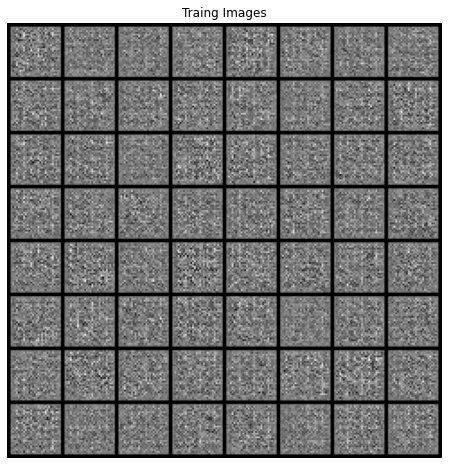

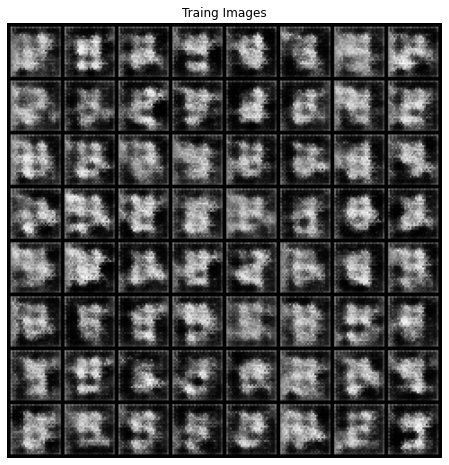

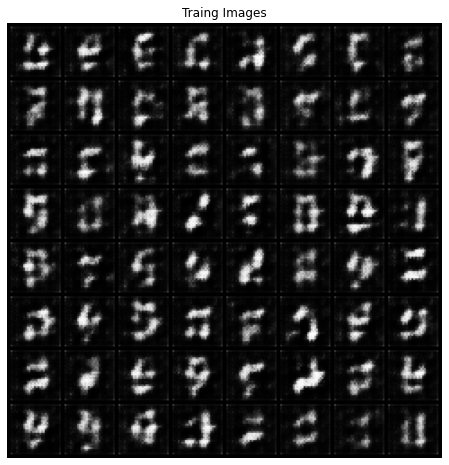

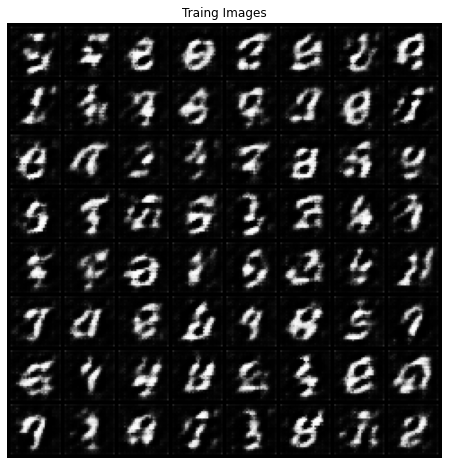

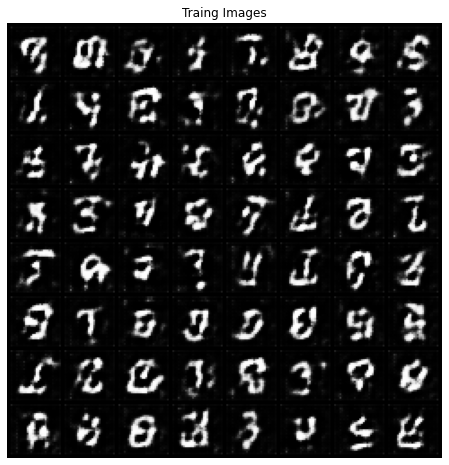

...

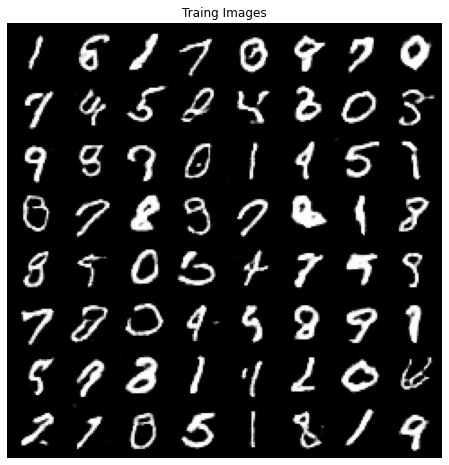

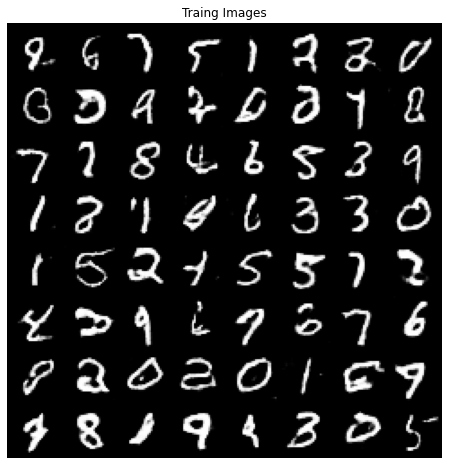

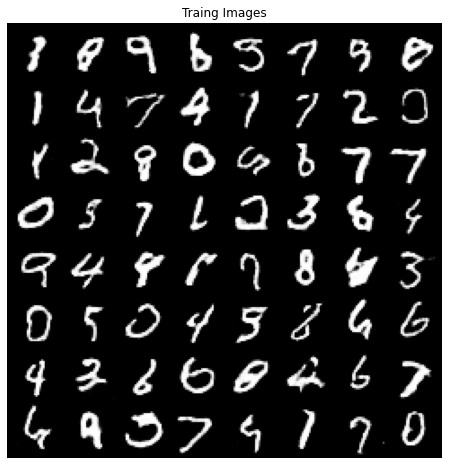

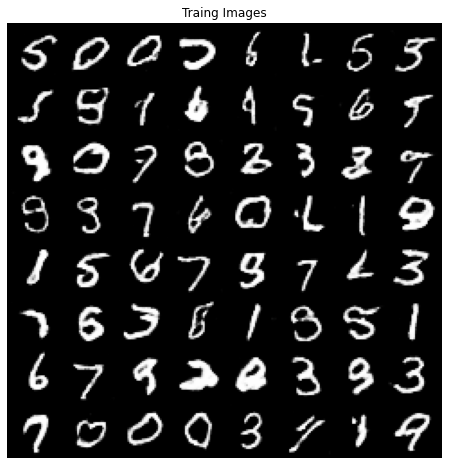

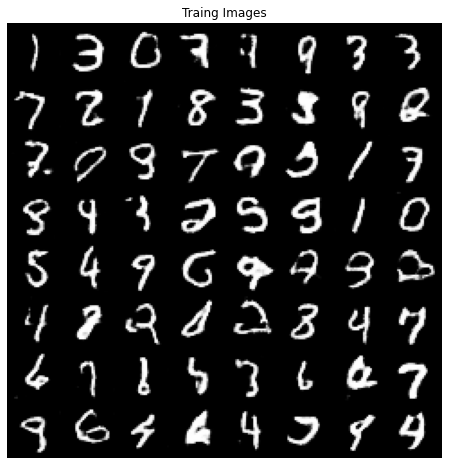

In [10]:
# Training
for epoch in range(opt.n_epochs):
    for i, (imgs) in enumerate(dataloader):
        
        # Adversarial ground truths
        real = Tensor(imgs.size(0), 1).fill_(1.0)
        fake = Tensor(imgs.size(0), 1).fill_(0.0)
        
        # Configure input
        real_imgs = imgs.type(Tensor)
        
        # Sample noise as generator input
        z = Tensor(np.random.normal(0, 1, (imgs.shape[0], opt.latent_dim, 1, 1)))
        
        # Generate a batch of images
        fake_imgs = netG(z)
        
        # ---------------------
        #  Train Discriminator
        # ---------------------
            
        optimizer_D.zero_grad()
        
        # Measure discriminator's ability to classify real from generated samples
        real_loss = criterion(netD(real_imgs), real)
        fake_loss = criterion(netD(fake_imgs.detach()), fake)
        d_loss = (real_loss + fake_loss) / 2 
        d_loss.backward()
        optimizer_D.step()
        
        # -----------------
        #  Train Generator
        # -----------------
        
        optimizer_D.zero_grad()
        
        # Loss measures generator's ability to fool thr discriminator
        g_loss = criterion(netD(fake_imgs), real)
        
        g_loss.backward()
        optimizer_G.step()
        
        if i%81 == 0:
            plt.figure(figsize=(8,8))
            plt.axis("off")
            plt.title("Traing Images")
            plt.imshow(np.transpose(vutils.make_grid(fake_imgs.to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
        
        print(
            "[Epoch %d/%d] [Batch %d/%d] [D loss: %f] [G loss: %f]"
            % (epoch, opt.n_epochs, i+1, len(dataloader), d_loss.item(), g_loss.item())
        )
            